# images for FIGURE 6


### Linf norm

In [1]:
import utils
import enumeration
import utils_func
import argparse
import torch
import gc

from torchvision.transforms import transforms


gc.collect()
torch.cuda.empty_cache()


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# model_names_dict = {
#     "trades": "Zhang2019Theoretically",#2
#     "mart": "Wang2020Improving",#3
#     "wang2023": "Wang2023Better_WRN-70-16",#5
#     'SAT' : 'Engstrom2019Robustness',#1
#     'wu2020' : 'Wu2020Adversarial',#4
    
# }

model_names_dict   = {
    "wang2023": "Wang2023Better_WRN-28-10",
    'SAT' : 'Engstrom2019Robustness',
    #'wu2020': 'Wu2020Adversarial',
}
sadajem = '/media/mary/T7/code/LE_PGD/ablation/models/sajem/sadajem5_95.5_9.4.pt'

/home/mary/miniconda3/envs/robust/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# parse arguments
parser = argparse.ArgumentParser(description="Process some parameters.")
parser.add_argument("--wandb_logging", type=bool, default=False, help="log to wandb")
parser.add_argument("--batch_size", type=int, default=64, help="batch size")
parser.add_argument(
    "--dataset",
    type=str,
    default="cifar10",
    choices=["cifar10", "cifar100"],
    help="dataset",
)
parser.add_argument("--epsilon", type=float, default=8 / 255, help="epsilon")
parser.add_argument("--alpha", type=float, default=2 / 255, help="alpha")
parser.add_argument(
    "--sampling_iterations", type=int, default=20, help="sampling iterations"
)
parser.add_argument(
    "--architecture_name", type=str, default="WideResNet", help="architecture name"
)
parser.add_argument(
    "--from_robustbench", type=bool, default=True, help="load model from robustbench"
)
parser.add_argument(
    "--init",
    type=str,
    default="random",
    choices=["random", "pca", "gaussian", "informative", "informative+pca"],
    help="initialization for the generation",
)

parser.add_argument("--seed", type=int, default=0, help="random seed")
parser.add_argument("--data_dir", type=str, default="./data", help="data directory")
parser.add_argument(
    "--model_name",
    type=str,
    default="Zhang2019Theoretically",
    choices=[model_names_dict.keys()],
    help="define the name of the model to be loaded",
)
parser.add_argument(
    "--model_source",
    type=str,
    default="robustbench",
    choices=["robustbench", "jem", "local"],
    help="the source from where the model is loaded",
)
parser.add_argument(
    "--model_dir",
    type=str,
    default="./models",
)
parser.add_argument(
    "--threat model",
    type=str,
    default="L2",
    choices=["Linf", "L2"],
    help="threat model",
)


try:
    args = parser.parse_args()
    wandb = args.wandb_logging
    batch_size = args.batch_size
    dataset = args.dataset
    epsilon = args.epsilon
    alpha = args.alpha
    sampling_iterations = args.sampling_iterations
    architecture_name = args.architecture_name
    from_robustbench = args.from_robustbench
    initialization = args.init
    data_dir = args.data_dir
    seed = args.seed
    model_name = args.model_name
    model_source = args.model_source
    model_dir = args.model_dir
    threat_model = args.threat_model

    print("Using arguments from parser")

except:
    print("Using default arguments")
    wandb = False
    batch_size = 64
    dataset = "cifar10"
    epsilon = 8 / 255
    alpha = 2 / 255
    sampling_iterations = 20
    architecture_name = "WideResNet"
    from_robustbench = True
    init = "random"
    data_dir = "./data"
    seed = 0
    model_name = "Wang2020Improving"
    source = 'robustbench'
    model_dir = "./models"
    threat_model = "Linf"

Using default arguments


In [3]:
from utils import fix_seed

fix_seed(seed=seed)

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset_train, dataset_test = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=transform,
)
train_dataloader = torch.utils.data.DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True
)
test_dataloader = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False
)

Files already downloaded and verified
Files already downloaded and verified


In [4]:
from utils import fix_seed

fix_seed(seed=seed)

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset_train, dataset_test = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=transform,
)
train_dataloader = torch.utils.data.DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True
)
test_dataloader = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False
)



Files already downloaded and verified
Files already downloaded and verified


In [5]:
from robustbench.utils import load_model
from torch import nn

from JEMPP.models.jem_models import F, CCF
from JEMPP.models.wideresnet import Wide_ResNet as WideResNet
from robustbench.model_zoo.architectures.resnet import ResNet18


architecture_dict = {'wideresnet': WideResNet, 'resnet': ResNet18}

assert architecture_name.lower() in architecture_dict.keys()
models = {}
for m_name in model_names_dict.keys():
    models[m_name] = None

for i, model_name_i in enumerate(model_names_dict.keys()):
    
    if model_source == "robustbench":
        model = load_model(
            model_name=model_names_dict[model_name_i],
            dataset=dataset,
            threat_model=threat_model,
            model_dir="./models",
        )
        model = nn.DataParallel(model, device_ids=[0])
        model.to(device)
    elif model_source == "jem":
        model_cls = F
        model = model_cls(
            enumeration.dataset_image_size[dataset],
            enumeration.dataset_num_classes[dataset],
            norm="batch",
            n_classes=enumeration.dataset_num_classes[dataset],
            model="wrn",
        )
        ckpt_dict = torch.load("./models/cifar10/Linf/sadajem5_95.5_9.4.pt")
        model.load_state_dict(ckpt_dict["model_state_dict"])
        model = nn.DataParallel(model, device_ids=[0, 1])
        model.to(device)
        replay_buffer = ckpt_dict["replay_buffer"]

    elif model_source == "local":
        model_path = model_dir + "/wandb_model/" + model_name + ".pt"
        # check missimg 2 factors in architecture instanciation
        model = (
            architecture_dict[architecture_name]()
            .to(device)
            .load_state_dict(torch.load(model_path))
            .eval()
        )
    
    models[model_name_i]=model.module
    del model
    print(f"Model {model_name_i} loaded")


Model wang2023 loaded
Model SAT loaded


In [6]:
utils_func.category_mean(
    dload_train=train_dataloader,
    n_classes=enumeration.dataset_num_classes[dataset],
    name_dataset=dataset,
    image_size=enumeration.dataset_image_size[dataset],
    n_channels=3,
    data_dir=data_dir,
)
buffer = []

replay_buffer = []

> Mean and Covariance Already Computed, skipping


In [7]:
num_samples = 5
label_to_plot = [0, 1, 2, 3,4 ]# 8, 9]
loss = "energy_xy"
sgld = "SGLD"

In [8]:
import torch
import matplotlib.pyplot as plt
import numpy as np
# Function to plot images from two models in separate grids
def plot_images(model1_images_tensor, num_img, dpi=64):
    num_classes, num_images_per_class = (
        model1_images_tensor.shape[0] // (num_img),
        num_img,
    )

    # Calculate the figure size based on the resolution and the number of images
    fig_width = num_images_per_class
    fig_height = num_classes

    # Create a figure with subplots
    fig, axes = plt.subplots(
        num_classes, num_images_per_class, figsize=(fig_width, fig_height), dpi=dpi
    )

    # Plot images from the first model
    for i in range(num_classes):
        for j in range(num_images_per_class):
            img = model1_images_tensor[i * num_images_per_class + j].cpu().numpy()
            axes[i, j].imshow(np.transpose(img, (1, 2, 0)))
            axes[i, j].axis("off")

    # Remove white space between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [9]:
try: 
    del all_samples
except:
    pass

model = models['wang2023']

# Set the model to evaluation mode
model.eval()

import matplotlib.pyplot as plt

init, img = [], []
imgs_class = {}
NUM_SAMPLES =10
BUFFER = REPLAY_BUFFER = []
for labels in label_to_plot:
    fix_seed(seed=seed)

    x0, imgs , all_samples = utils.new_samples(
        model=model,
        label=labels,
        batch_size=NUM_SAMPLES,
        step_size=0.05,
        n_steps=150,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        #compute_energy_model=True,
        momentum=0.8,
    )
    init.append(x0)
    img.append(imgs)
    imgs_class[labels] = all_samples
    
init_cat = torch.cat(init, dim=0)
img_cat = torch.cat(img, dim=0)


Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 525 with  retained_variance 0.99
Using number of componets 630 with  retained_variance 0.99


In [10]:
import cv2
frames = []
for k,v in imgs_class.items():
    frames.append(v.detach().cpu())
# from list to tensor

print("GENERATING THE GIF FOR THE GENERATION PROCESS")

combined_tensor = torch.cat(frames, dim=1)  # shape (50, 25, 3, 32, 32)
# Function to arrange 25 images in a 5x5 grid
def make_grid(images, grid_size=10, classes = 5):
    n, c, h, w = images.shape  # (25, 3, 32, 32)
    grid_h =  h * classes
    grid_w = grid_size * w
    grid = np.zeros((grid_h, grid_w, c), dtype=np.uint8)
    for i in range(classes):
        for j in range(grid_size):
            img = images[i * grid_size + j].permute(1, 2, 0).cpu().numpy()  # (32, 32, 3)
            grid[i * h:(i + 1) * h, j * w:(j + 1) * w, :] = img
    return grid

# Convert each frame to a 5x5 grid and save frames
frames = []
for frame in range(combined_tensor.shape[0]):
    # values in the range 
    images = combined_tensor[frame]  # shape (25, 3, 32, 32)
    images = images * 255
    # channel inverion 
    
    grid = make_grid(images)
    grid = cv2.cvtColor(grid, cv2.COLOR_RGB2BGR)
    frames.append(grid)

# Create video from frames
height, width, layers = frames[0].shape
video = cv2.VideoWriter('video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 10, (width, height))

for frame in frames:
    video.write(frame)

video.release()

#from video to gif
from moviepy.editor import VideoFileClip

# Load the MP4 video
clip = VideoFileClip("video.mp4")

# Convert the video to GIF
clip.write_gif("video.gif")

GENERATING THE GIF FOR THE GENERATION PROCESS
MoviePy - Building file video.gif with imageio.


In [ ]:
import matplotlib.pyplot as plt

for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    
    init, img = [], []
    for labels in label_to_plot:
        
        fix_seed(seed=seed)
        x0, imgs = utils.new_samples(
            model=model,
            label=labels,
            batch_size=num_samples,
            step_size=0.5,
            n_steps=20,
            inizialization='pca',
            n_steps_sampling=1,
            loss=loss,
            algo=sgld,
            alpha = 1,
            noise_variance=0.001,
            #momentum=0.5,
            replay_buffer=replay_buffer,
            buffer=buffer,
        )
        init.append(x0)
        img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    plot_images(img_cat, 5)
        

### L2 norm

Using default arguments
Files already downloaded and verified
Files already downloaded and verified
L2
Model wang2023 loaded
Model SAT loaded
Model wu2020 loaded
> Mean and Covariance Already Computed, skipping
Model wang2023
Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99


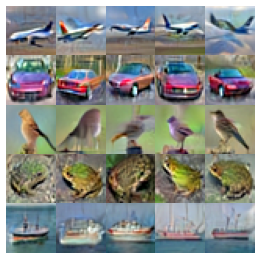

Model SAT
Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99


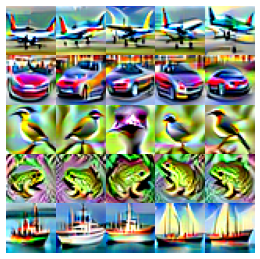

Model wu2020
Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99


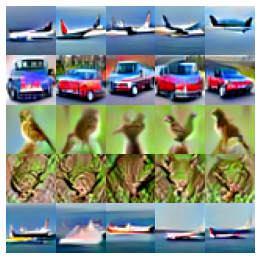

In [ ]:
import utils
import enumeration
import utils_func
import argparse
import torch
import gc

from torchvision.transforms import transforms


gc.collect()
torch.cuda.empty_cache()


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_names_dict   = {
    "wang2023": "Wang2023Better_WRN-28-10",
    'SAT' : 'Engstrom2019Robustness',
    'wu2020': 'Wu2020Adversarial',
}
parser = argparse.ArgumentParser(description="Process some parameters.")
parser.add_argument("--wandb_logging", type=bool, default=False, help="log to wandb")
parser.add_argument("--batch_size", type=int, default=64, help="batch size")
parser.add_argument(
    "--dataset",
    type=str,
    default="cifar10",
    choices=["cifar10", "cifar100"],
    help="dataset",
)
parser.add_argument("--epsilon", type=float, default=8 / 255, help="epsilon")
parser.add_argument("--alpha", type=float, default=2 / 255, help="alpha")
parser.add_argument(
    "--sampling_iterations", type=int, default=20, help="sampling iterations"
)
parser.add_argument(
    "--architecture_name", type=str, default="WideResNet", help="architecture name"
)
parser.add_argument(
    "--from_robustbench", type=bool, default=True, help="load model from robustbench"
)
parser.add_argument(
    "--init",
    type=str,
    default="random",
    choices=["random", "pca", "gaussian", "informative", "informative+pca"],
    help="initialization for the generation",
)

parser.add_argument("--seed", type=int, default=0, help="random seed")
parser.add_argument("--data_dir", type=str, default="./data", help="data directory")
parser.add_argument(
    "--model_name",
    type=str,
    default="Zhang2019Theoretically",
    choices=[model_names_dict.keys()],
    help="define the name of the model to be loaded",
)
parser.add_argument(
    "--model_source",
    type=str,
    default="robustbench",
    choices=["robustbench", "jem", "local"],
    help="the source from where the model is loaded",
)
parser.add_argument(
    "--model_dir",
    type=str,
    default="./models",
)
parser.add_argument(
    "--threat model",
    type=str,
    default="L2",
    choices=["Linf", "L2"],
    help="threat model",
)


try:
    args = parser.parse_args()
    wandb = args.wandb_logging
    batch_size = args.batch_size
    dataset = args.dataset
    epsilon = args.epsilon
    alpha = args.alpha
    sampling_iterations = args.sampling_iterations
    architecture_name = args.architecture_name
    from_robustbench = args.from_robustbench
    initialization = args.init
    data_dir = args.data_dir
    seed = args.seed
    model_name = args.model_name
    model_source = args.model_source
    model_dir = args.model_dir
    threat_model = args.threat_model

    print("Using arguments from parser")

except:
    print("Using default arguments")
    wandb = False
    batch_size = 64
    dataset = "cifar10"
    epsilon = 8 / 255
    alpha = 2 / 255
    sampling_iterations = 20
    architecture_name = "WideResNet"
    from_robustbench = True
    init = "random"
    data_dir = "./data"
    seed = 0
    model_name = "Wang2020Improving"
    source = 'robustbench'
    model_dir = "./models"
    threat_model = "L2"
from utils import fix_seed

fix_seed(seed=seed)

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset_train, dataset_test = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=transform,
)
train_dataloader = torch.utils.data.DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True
)
test_dataloader = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False
)
from robustbench.utils import load_model
from torch import nn

from JEMPP.models.jem_models import F, CCF
from JEMPP.models.wideresnet import Wide_ResNet as WideResNet
print(threat_model)

architecture_dict = {'wideresnet': WideResNet}

assert architecture_name.lower() in architecture_dict.keys()
models = {}
for m_name in model_names_dict.keys():
    models[m_name] = None

for i, model_name_i in enumerate(model_names_dict.keys()):
    
    if model_source == "robustbench":
        model = load_model(
            model_name=model_names_dict[model_name_i],
            dataset=dataset,
            threat_model=threat_model,
            model_dir="./models",
        )
        model = nn.DataParallel(model, device_ids=[0])
        model.to(device)
    elif model_source == "jem":
        model_cls = F
        model = model_cls(
            enumeration.dataset_image_size[dataset],
            enumeration.dataset_num_classes[dataset],
            norm="batch",
            n_classes=enumeration.dataset_num_classes[dataset],
            model="wrn",
        )
        ckpt_dict = torch.load("./models/cifar10/Linf/sadajem5_95.5_9.4.pt")
        model.load_state_dict(ckpt_dict["model_state_dict"])
        model = nn.DataParallel(model, device_ids=[0, 1])
        model.to(device)
        replay_buffer = ckpt_dict["replay_buffer"]

    elif model_source == "local":
        model_path = model_dir + "/wandb_model/" + model_name + ".pt"
        # check missimg 2 factors in architecture instanciation
        model = (
            architecture_dict[architecture_name]()
            .to(device)
            .load_state_dict(torch.load(model_path))
            .eval()
        )
    
    models[model_name_i]=model.module
    del model
    print(f"Model {model_name_i} loaded")


utils_func.category_mean(
    dload_train=train_dataloader,
    n_classes=enumeration.dataset_num_classes[dataset],
    name_dataset=dataset,
    image_size=enumeration.dataset_image_size[dataset],
    n_channels=3,
    data_dir=data_dir,
)
buffer = utils.center_initialization(
    dataset=dataset, n_classes=enumeration.dataset_num_classes[dataset]
)


import torch
import matplotlib.pyplot as plt
import numpy as np
# Function to plot images from two models in separate grids
def plot_images(model1_images_tensor, num_img, dpi=64):
    num_classes, num_images_per_class = (
        model1_images_tensor.shape[0] // (num_img),
        num_img,
    )

    # Calculate the figure size based on the resolution and the number of images
    fig_width = num_images_per_class
    fig_height = num_classes

    # Create a figure with subplots
    fig, axes = plt.subplots(
        num_classes, num_images_per_class, figsize=(fig_width, fig_height), dpi=dpi
    )

    # Plot images from the first model
    for i in range(num_classes):
        for j in range(num_images_per_class):
            img = model1_images_tensor[i * num_images_per_class + j].cpu().numpy()
            axes[i, j].imshow(np.transpose(img, (1, 2, 0)))
            axes[i, j].axis("off")

    # Remove white space between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()


replay_buffer = []
num_samples = 5
label_to_plot = [0, 1, 2, 6,8]
loss = "energy_xy"
sgld = "SGLD"
import matplotlib.pyplot as plt

for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    
    init, img = [], []
    for labels in label_to_plot:
        
        fix_seed(seed=seed)
        x0, imgs  = utils.new_samples(
            model=model,
            label=labels,
            batch_size=num_samples,
            step_size=0.5,
            n_steps=20,
            inizialization='pca',
            n_steps_sampling=1,
            loss=loss,
            algo=sgld,
            alpha = 1,
            noise_variance=0.001,
            # momentum=0.8,
            replay_buffer=replay_buffer,
            buffer=buffer,
            variance = 0.99,           
        )
        init.append(x0)
        img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    plot_images(img_cat, 5)
        

# figure 7


In [ ]:
import utils
import enumeration
import utils_func
import argparse
import torch
import gc

from torchvision.transforms import transforms


gc.collect()
torch.cuda.empty_cache()


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_names_dict   = {
    "wang2023": "Wang2023Better_WRN-28-10",
    'SAT' : 'Engstrom2019Robustness',
    # 'wu2020': 'Wu2020Adversarial',
}
parser = argparse.ArgumentParser(description="Process some parameters.")
parser.add_argument("--wandb_logging", type=bool, default=False, help="log to wandb")
parser.add_argument("--batch_size", type=int, default=64, help="batch size")
parser.add_argument(
    "--dataset",
    type=str,
    default="cifar10",
    choices=["cifar10", "cifar100"],
    help="dataset",
)
parser.add_argument("--epsilon", type=float, default=8 / 255, help="epsilon")
parser.add_argument("--alpha", type=float, default=2 / 255, help="alpha")
parser.add_argument(
    "--sampling_iterations", type=int, default=20, help="sampling iterations"
)
parser.add_argument(
    "--architecture_name", type=str, default="WideResNet", help="architecture name"
)
parser.add_argument(
    "--from_robustbench", type=bool, default=True, help="load model from robustbench"
)
parser.add_argument(
    "--init",
    type=str,
    default="random",
    choices=["random", "pca", "gaussian", "informative", "informative+pca"],
    help="initialization for the generation",
)

parser.add_argument("--seed", type=int, default=0, help="random seed")
parser.add_argument("--data_dir", type=str, default="./data", help="data directory")
parser.add_argument(
    "--model_name",
    type=str,
    default="Zhang2019Theoretically",
    choices=[model_names_dict.keys()],
    help="define the name of the model to be loaded",
)
parser.add_argument(
    "--model_source",
    type=str,
    default="robustbench",
    choices=["robustbench", "jem", "local"],
    help="the source from where the model is loaded",
)
parser.add_argument(
    "--model_dir",
    type=str,
    default="./models",
)
parser.add_argument(
    "--threat model",
    type=str,
    default="L2",
    choices=["Linf", "L2"],
    help="threat model",
)


try:
    args = parser.parse_args()
    wandb = args.wandb_logging
    batch_size = args.batch_size
    dataset = args.dataset
    epsilon = args.epsilon
    alpha = args.alpha
    sampling_iterations = args.sampling_iterations
    architecture_name = args.architecture_name
    from_robustbench = args.from_robustbench
    initialization = args.init
    data_dir = args.data_dir
    seed = args.seed
    model_name = args.model_name
    model_source = args.model_source
    model_dir = args.model_dir
    threat_model = args.threat_model

    print("Using arguments from parser")

except:
    print("Using default arguments")
    wandb = False
    batch_size = 64
    dataset = "cifar10"
    epsilon = 8 / 255
    alpha = 2 / 255
    sampling_iterations = 20
    architecture_name = "WideResNet"
    from_robustbench = True
    init = "random"
    data_dir = "./data"
    seed = 0
    model_name = "Wang2020Improving"
    source = 'robustbench'
    model_dir = "./models"
    threat_model = "L2"
from utils import fix_seed

fix_seed(seed=seed)

transform = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

dataset_train, dataset_test = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=transform,
)
train_dataloader = torch.utils.data.DataLoader(
    dataset_train, batch_size=batch_size, shuffle=True
)
test_dataloader = torch.utils.data.DataLoader(
    dataset_test, batch_size=batch_size, shuffle=False
)
from robustbench.utils import load_model
from torch import nn

from JEMPP.models.jem_models import F, CCF
from JEMPP.models.wideresnet import Wide_ResNet as WideResNet
print(threat_model)

architecture_dict = {'wideresnet': WideResNet}

assert architecture_name.lower() in architecture_dict.keys()
models = {}
for m_name in model_names_dict.keys():
    models[m_name] = None

for i, model_name_i in enumerate(model_names_dict.keys()):
    
    if model_source == "robustbench":
        model = load_model(
            model_name=model_names_dict[model_name_i],
            dataset=dataset,
            threat_model=threat_model,
            model_dir="./models",
        )
        model = nn.DataParallel(model, device_ids=[0])
        model.to(device)
    elif model_source == "jem":
        model_cls = F
        model = model_cls(
            enumeration.dataset_image_size[dataset],
            enumeration.dataset_num_classes[dataset],
            norm="batch",
            n_classes=enumeration.dataset_num_classes[dataset],
            model="wrn",
        )
        ckpt_dict = torch.load("./models/cifar10/Linf/sadajem5_95.5_9.4.pt")
        model.load_state_dict(ckpt_dict["model_state_dict"])
        model = nn.DataParallel(model, device_ids=[0, 1])
        model.to(device)
        replay_buffer = ckpt_dict["replay_buffer"]

    elif model_source == "local":
        model_path = model_dir + "/wandb_model/" + model_name + ".pt"
        # check missimg 2 factors in architecture instanciation
        model = (
            architecture_dict[architecture_name]()
            .to(device)
            .load_state_dict(torch.load(model_path))
            .eval()
        )
    
    models[model_name_i]=model.module
    del model
    print(f"Model {model_name_i} loaded")


utils_func.category_mean(
    dload_train=train_dataloader,
    n_classes=enumeration.dataset_num_classes[dataset],
    name_dataset=dataset,
    image_size=enumeration.dataset_image_size[dataset],
    n_channels=3,
    data_dir=data_dir,
)
# buffer = utils.center_initialization(
#     dataset=dataset, n_classes=enumeration.dataset_num_classes[dataset]
# )


import torch
import matplotlib.pyplot as plt
import numpy as np
# Function to plot images from two models in separate grids
def plot_images(model1_images_tensor, num_img, dpi=64, name = 'test'):
    num_classes, num_images_per_class = (
        model1_images_tensor.shape[0] // (num_img),
        num_img,
    )

    # Calculate the figure size based on the resolution and the number of images
    fig_width = num_images_per_class
    fig_height = num_classes

    # Create a figure with subplots
    fig, axes = plt.subplots(
        num_classes, num_images_per_class, figsize=(fig_width, fig_height), dpi=dpi
    )

    # Plot images from the first model
    for i in range(num_classes):
        if num_images_per_class == 1:
            img = model1_images_tensor[i].cpu().numpy()
            axes[i].imshow(np.transpose(img, (1, 2, 0)))
            axes[i].axis("off")
        else: 
            for j in range(num_images_per_class):
                img = model1_images_tensor[i * num_images_per_class + j].cpu().numpy()
                axes[i, j].imshow(np.transpose(img, (1, 2, 0)))
                axes[i, j].axis("off")

    # Remove white space between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig(f'{name}.pdf')
    plt.show()

/home/mary/miniconda3/envs/robust/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using default arguments
Files already downloaded and verified
Files already downloaded and verified
L2
Model wang2023 loaded
Model SAT loaded
> Mean and Covariance Already Computed, skipping


In [ ]:

buffer = replay_buffer = []
num_samples = 50
label_to_plot = [[i] for i in range(10)]
loss = "energy_xy"
sgld = "SGLD"
NUM_SAMPLES = 50
N_STEPS = 50
num_classes = 10

### Fig 7a, 7b, 7c


#### fig 7a

Model wang2023


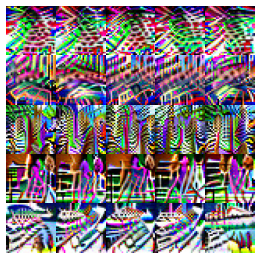

In [ ]:
for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    
    init, img = [], []
    imgs_class = {}
    for labels in label_to_plot:
        
        fix_seed(seed=seed)
        x0, imgs  = utils.new_samples(
            model=model,
            label=labels,
            batch_size=10,
            step_size=0.5,
            n_steps=2500,
            inizialization='random',
            n_steps_sampling=1,
            loss=loss,
            # algo='Heun',
            alpha = 1,
            noise_variance=0.001,
            momentum=0.8,
            replay_buffer=replay_buffer,
            buffer=buffer,
            #variance = 0.99,           
        )
        init.append(x0)
        img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    plot_images(img_cat, 5)
        

#### fig 7b

Model wang2023


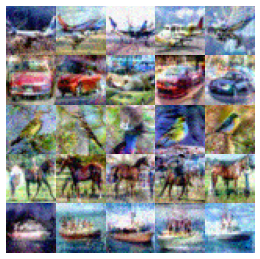

In [ ]:
for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    
    init, img = [], []
    for labels in label_to_plot:
        
        fix_seed(seed=seed)
        x0, imgs  = utils.new_samples(
            model=model,
            label=labels,
            batch_size=num_samples,
            step_size=0.5,
            n_steps=50,
            inizialization='informative',
            n_steps_sampling=1,
            loss=loss,
            # algo='Heun',
            alpha = 1,
            noise_variance=0.001,
            #momentum=0.8,
            replay_buffer=replay_buffer,
            buffer=buffer,
            #variance = 0.99,           
        )
        init.append(x0)
        img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    plot_images(img_cat, 5)
        

#### fig 7c

In [ ]:
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
import cv2


for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    imgs_class = {}

    init, img = [], []
    for labels in label_to_plot:

        fix_seed(seed=seed)
        x0, imgs, all_samples = utils.new_samples(
            model=model,
            label=labels,
            batch_size=10,
            step_size=0.05,
            n_steps=150,
            inizialization="random",
            n_steps_sampling=1,
            loss=loss,
            # algo='Heun',
            alpha=1,
            noise_variance=0.001,
            momentum=0.8,
            replay_buffer=replay_buffer,
            buffer=buffer,
            variance=0.99,
        )
        init.append(x0)
        img.append(imgs)
        imgs_class[labels[0]] = all_samples

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    # plot_images(img_cat, 5)

    frames = []
    for k, v in imgs_class.items():
        frames.append(v.detach().cpu())
    # from list to tensor

    combined_tensor = torch.cat(frames, dim=1)  # shape (50, 25, 3, 32, 32)
    # Function to arrange 25 images in a 5x5 grid
    def make_grid(images, grid_size=10, classes=5):
        n, c, h, w = images.shape  # (25, 3, 32, 32)
        
        grid_h = h * classes
        grid_w = grid_size * w
        grid = np.zeros((grid_h, grid_w, c), dtype=np.uint8)
        for i in range(classes):
            for j in range(grid_size):
                img = (
                    images[i * grid_size + j].permute(1, 2, 0).cpu().numpy()
                )  # (32, 32, 3)
                grid[i * h : (i + 1) * h, j * w : (j + 1) * w, :] = img
        return grid

    # Convert each frame to a 5x5 grid and save frames
    frames = []
    for frame in range(combined_tensor.shape[0]):
        # values in the range
        images = combined_tensor[frame]  # shape (25, 3, 32, 32)
        images = images * 255
        # channel inverion

        grid = make_grid(images, classes=10)
        grid = cv2.cvtColor(grid, cv2.COLOR_RGB2BGR)
        frames.append(grid)

    # Create video from frames
    height, width, layers = frames[0].shape
    video = cv2.VideoWriter(
        f"{model_name}_random.mp4",
        cv2.VideoWriter_fourcc(*"mp4v"),
        int(len(frames) / 5),
        (width, height),
    )

    for frame in frames:
        video.write(frame)

    video.release()

    # Load the MP4 video
    clip = VideoFileClip(f"{model_name}_random.mp4")

    # Convert the video to GIF
    clip.write_gif(f"{model_name}_random.gif")

In [ ]:
height, width, layers = frames[0].shape
video = cv2.VideoWriter('betterDM_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 1, (width, height))

for frame in frames:
    video.write(frame)

video.release()
#from video to gif
from moviepy.editor import VideoFileClip

# Load the MP4 video
clip = VideoFileClip("betterDM_video.mp4")

# Convert the video to GIF
clip.write_gif("betterDM_video.gif")

MoviePy - Building file betterDM_video.gif with imageio.


#### Heun sampling

Model wang2023
Using number of componets 73 with  retained_variance 0.9
Using number of componets 116 with  retained_variance 0.9
Using number of componets 82 with  retained_variance 0.9
Using number of componets 125 with  retained_variance 0.9
Using number of componets 74 with  retained_variance 0.9


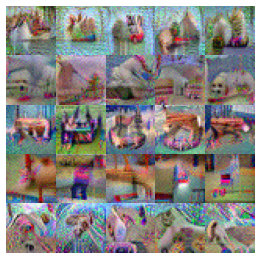

In [ ]:

import matplotlib.pyplot as plt

for model_name in model_names_dict.keys():
    model = models[model_name]
    print(f"Model {model_name}")
    
    init, img = [], []
    for labels in label_to_plot:
        
        fix_seed(seed=seed)
        x0, imgs  = utils.new_samples(
            model=model,
            label=labels,
            batch_size=num_samples,
            step_size=0.05,
            n_steps=150,
            inizialization='pca',
            n_steps_sampling=1,
            loss=loss,
            # algo='Heun',
            alpha = 1,
            noise_variance=0.01,
            momentum=0.8,
            replay_buffer=replay_buffer,
            buffer=buffer,
            variance = 0.99,           
        )
        init.append(x0)
        img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)
        # Call the function with your tensors
    plot_images(img_cat, 5)
        

# Proposed setting

In [ ]:
TRANSFORM = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)

DATASET_TRAIN, DATASET_TEST = utils.load_clean_dataset(
    dataset=enumeration.BenchmarkDataset(dataset.lower()),
    n_examples=None,
    data_dir=data_dir,
    transform=TRANSFORM,
)

BATCH_SIZE = len(DATASET_TRAIN)

TRAIN_DATALOADER = torch.utils.data.DataLoader(
    DATASET_TRAIN, batch_size=BATCH_SIZE, shuffle=True
)

TEST_DATALOADER = torch.utils.data.DataLoader(
    DATASET_TEST, batch_size=len(DATASET_TEST), shuffle=False
)
print(f"threat model: {threat_model}")

utils_func.category_mean(
    dload_train=TRAIN_DATALOADER,
    n_classes=enumeration.dataset_num_classes[dataset],
    name_dataset=dataset,
    image_size=enumeration.dataset_image_size[dataset],
    n_channels=3,
    data_dir=data_dir,
)
BUFFER = []

REPLAY_BUFFER = []
BATCH = next(iter(TRAIN_DATALOADER))
# images
BATCH_IMAGES = BATCH[0].to(device)
# labels
BATCH_LABELS = BATCH[1].to(device)

Files already downloaded and verified
Files already downloaded and verified
threat model: Linf
> Mean and Covariance Already Computed, skipping


/media/mary/T7/code/LE_PGD/ablation
loading mean and stddev energy


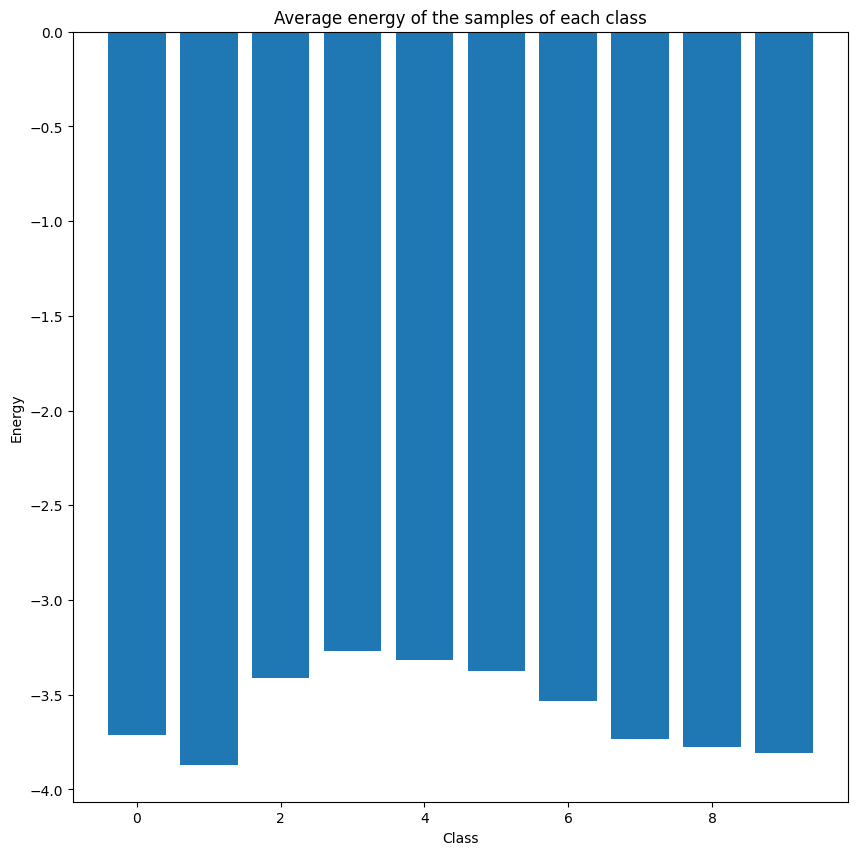

In [ ]:
# obtain the energy of a sample of a certain class
import matplotlib.pyplot as plt
import numpy as np
import utils_func

import pickle, os
cur_dir  = os.getcwd()
print(cur_dir)
if not os.path.exists(cur_dir + f"/data/{threat_model}_mean_en_{dataset}.pkl") and not os.path.exists(cur_dir + f"/data/mean_en_{dataset}.pkl"):
    # plot the average of the energy of the samples of each class
    print("average energy of the samples of each class")
    EN_FOR_CLASS = {i: [] for i in range(10)}
    STDDEV_EN_PER_CLASS = {i: [] for i in range(10)}

    for i, image in enumerate(BATCH_IMAGES):
        logits = models["wang2023"](image.unsqueeze(0))
        en = utils_func.compute_energy_xy(logits, BATCH_LABELS[i])
        EN_FOR_CLASS[BATCH_LABELS[i].item()].append(en.item())
        # compute stddv of the energy of the samples of each class
        STDDEV_EN_PER_CLASS[BATCH_LABELS[i].item()].append(en.item())    
    

    MEAN_EN = []
    STDDEV_EN = []
    # average energy of the samples of each class
    for i in range(10):
        print(f"class {i} : {np.mean(EN_FOR_CLASS[i])}")
        MEAN_EN.append(np.mean(EN_FOR_CLASS[i]))
        
    # compute the stddev for each class
    for i in range(10):
        print(f"class {i} : {np.std(STDDEV_EN_PER_CLASS[i])}")
        STDDEV_EN.append(np.std(STDDEV_EN_PER_CLASS[i]))
        
    with open(cur_dir + f"/data/{threat_model}_mean_en_{dataset}.pkl", "wb") as f:
        pickle.dump(MEAN_EN, f)
    with open(cur_dir + f"/data/{threat_model}_stddev_en_{dataset}.pkl", "wb") as f:
        pickle.dump(STDDEV_EN, f)
    
else:
    print("loading mean and stddev energy")
    with open(cur_dir + f"/data/{threat_model}_mean_en_{dataset}.pkl", "rb") as f:
        MEAN_EN = pickle.load(f)
    with open(cur_dir + f"/data/{threat_model}_stddev_en_{dataset}.pkl", "rb") as f:
        STDDEV_EN = pickle.load(f)

# plot the average of the energy of the samples of each class as histograms
plt.figure(figsize=(10, 10))
plt.bar(range(10), MEAN_EN)
plt.xlabel("Class")
plt.ylabel("Energy")
plt.title("Average energy of the samples of each class")
plt.show()


PLOT of THE PCA INIT
wang2023


Using number of componets 709 with  retained_variance 0.99


/home/mary/miniconda3/envs/robustbench/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392020201/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
wang2023
Using number of componets 709 with  retained_variance 0.99
labels 6  imges torch.Size([100, 3, 32, 32])


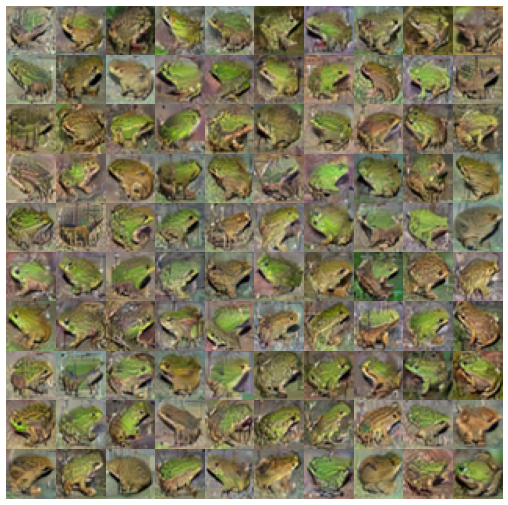

wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
wang2023
Using number of componets 604 with  retained_variance 0.99
labels 7  imges torch.Size([100, 3, 32, 32])


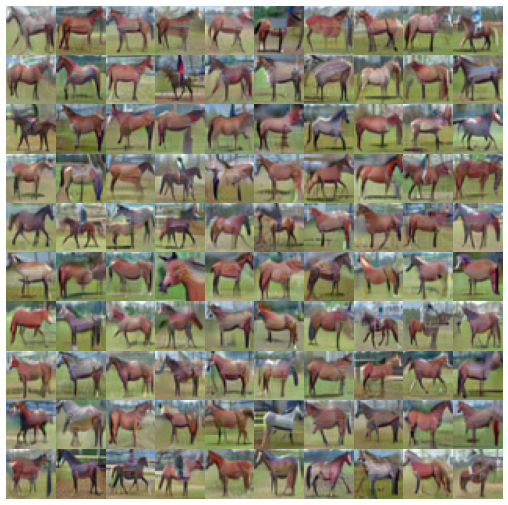

wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
wang2023
Using number of componets 510 with  retained_variance 0.99
labels 8  imges torch.Size([100, 3, 32, 32])


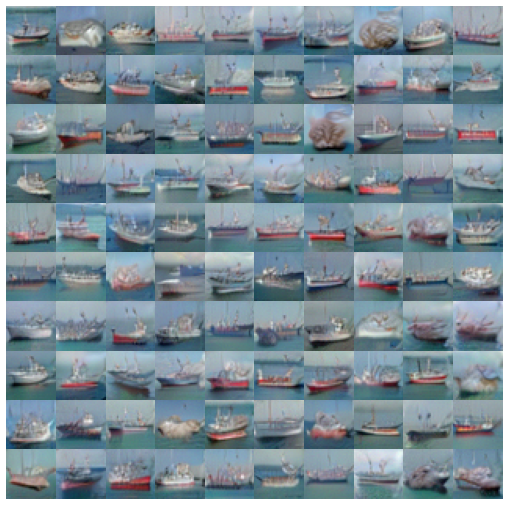

wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
wang2023
Using number of componets 659 with  retained_variance 0.99
labels 9  imges torch.Size([100, 3, 32, 32])


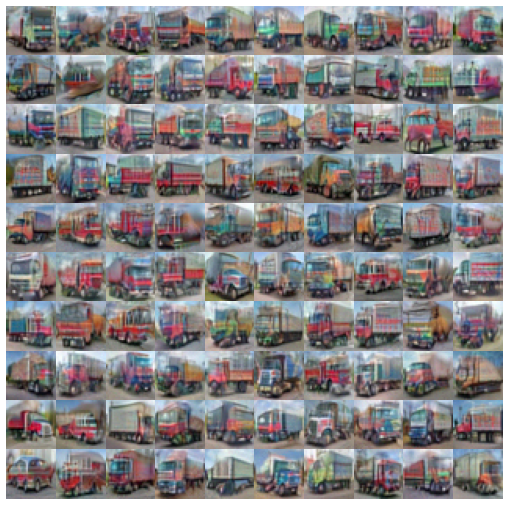

In [ ]:
pca_ENERGY_DICT_xy_dist_momentum_HM = {
    f"{i}_{j}": [] for j in range(num_classes) for i in range(num_classes)
}
size_plots = 20
NUM_SAMPLES = 100
print("PLOT of THE PCA INIT")
import pickle
for labels in label_to_plot:
    init, img = [], []
    for it in range(5):
        for name, model in models.items():
            print(name)

            fix_seed(seed=seed + it)
            x0, imgs, energy = utils.new_samples(
                model=model,
                label=labels,
                batch_size=NUM_SAMPLES // 10,
                step_size=0.05,
                n_steps=150,
                inizialization="pca",
                N_STEPS_sampling=1,
                loss="energy_xy",
                replay_buffer=REPLAY_BUFFER,
                buffer=BUFFER,
                alpha=1,
                variance=0.99,
                noise_variance=0.001,
                compute_energy_model=True,
                momentum=0.8,
            )
            init.append(x0)
            img.append(imgs)

        init_cat = torch.cat(init, dim=0)
        img_cat = torch.cat(img, dim=0)

    print("labels", labels[0], " imges", img_cat.shape) 
    # save the image_cat vector
    with open(f"./data/img_cat_{labels[0]}.pkl", "wb") as f:
        pickle.dump(img_cat, f)
        
    plot_images(img_cat, 10,name=f"./data/img_cat_{labels[0]}" )

    for key, value in energy.items():
        if len(value) > 0:
            pca_ENERGY_DICT_xy_dist_momentum_HM[key] = value
    img_cat = None


pca_ENERGY_DICT_dist_momentum_HM = {
    f"{i}_{j}": [] for j in range(num_classes) for i in range(num_classes)
}
for key, value in pca_ENERGY_DICT_xy_dist_momentum_HM.items():
    for sample in range(NUM_SAMPLES):
        flag_list = [value[i + sample] for i in range(0, len(value), NUM_SAMPLES)]
        pca_ENERGY_DICT_dist_momentum_HM[key].append(flag_list)

In [ ]:
import pickle
 # save the image_cat vector
with open(f"./data/img_cat_{labels[0]}.pkl", "wb") as f:
    pickle.dump(img_cat, f)

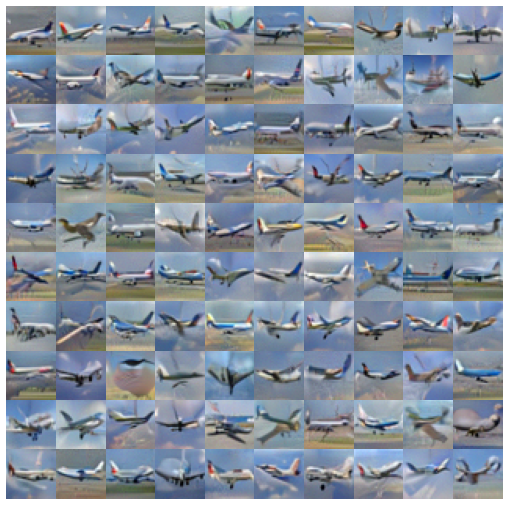

In [ ]:
plot_images(img_cat, 10,name=f"./data/img_cat_{labels[0]}" )

# Energy analysis

['/usr/share/fonts/truetype/noto/NotoSansSundanese-Bold.ttf', '/usr/share/fonts/truetype/noto/NotoSansWarangCiti-Regular.ttf', '/usr/share/fonts/truetype/noto/NotoSansMayanNumerals-Regular.ttf', '/usr/share/fonts/truetype/ubuntu/UbuntuMono-B.ttf', '/usr/share/fonts/truetype/noto/NotoSansTelugu-Bold.ttf', '/usr/share/fonts/truetype/noto/NotoSansSamaritan-Regular.ttf', '/usr/share/texmf/fonts/opentype/public/tex-gyre-math/texgyrebonum-math.otf', '/usr/share/texmf/fonts/opentype/public/lm/lmmonolt10-bold.otf', '/usr/share/fonts/truetype/noto/NotoSansEthiopic-Bold.ttf', '/usr/share/fonts/truetype/noto/NotoKufiArabic-Regular.ttf', '/usr/share/texmf/fonts/opentype/public/tex-gyre/texgyrecursor-bold.otf', '/usr/share/fonts/truetype/noto/NotoSansDeseret-Regular.ttf', '/usr/share/fonts/truetype/linex/apiitali.ttf', '/usr/share/fonts/truetype/noto/NotoSansDisplay-Bold.ttf', '/usr/share/fonts/truetype/noto/NotoSerifKhmer-Bold.ttf', '/usr/share/texmf/fonts/opentype/public/lm/lmsans10-bold.otf', '/

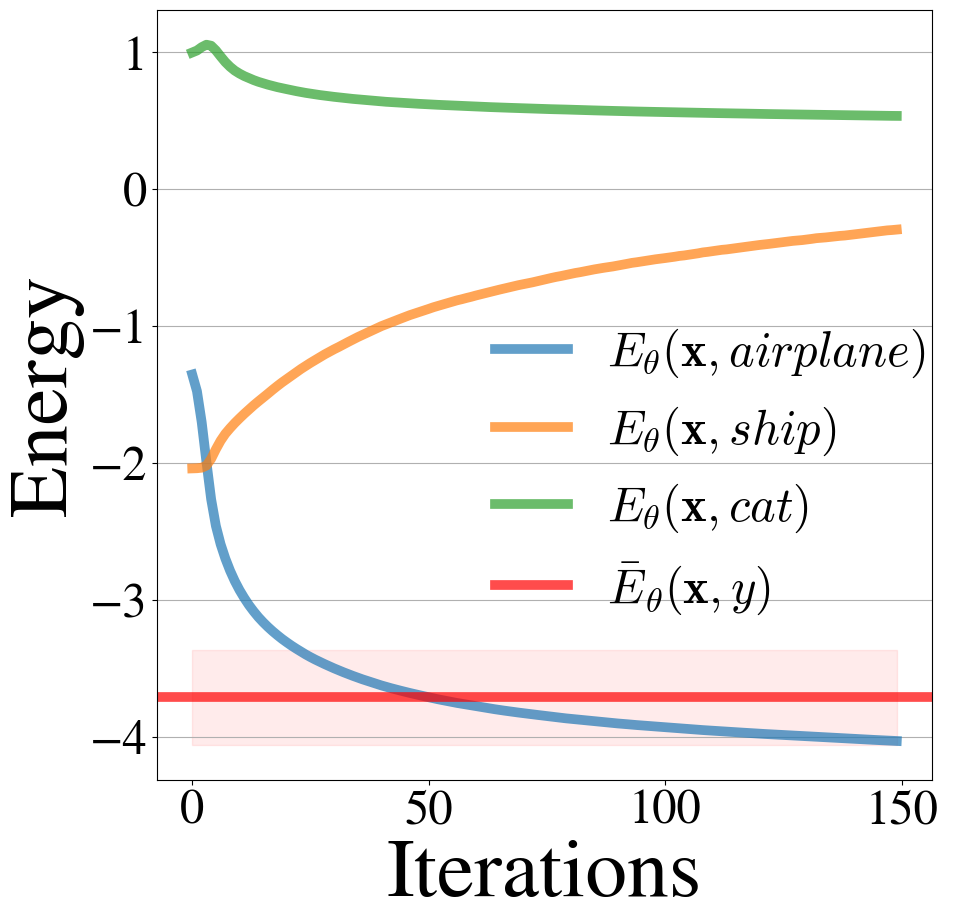

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
print(matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf'))



plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['text.usetex'] = False
sample_index = 2

class_index = 0

plt.figure(figsize= (10,10))


cifar10_dict = {
    0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat', 4: 'deer',
    5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship', 9: 'truck'
}

for c in [class_index, 8, 3]:
    plt.plot(pca_ENERGY_DICT_dist_momentum_HM[f'{class_index}_{c}'][sample_index], '-',
             label=r"$E_{\theta}(\mathbf{x}," + f"{cifar10_dict[c]})$", linewidth=7, alpha=0.7)


plt.axhline(y=MEAN_EN[class_index], linestyle='-', label="$\\bar{E}_{\\theta}(\\mathbf{x},y)$", color='r', linewidth=7, alpha=0.7)
# plot also stddev
plt.fill_between(range(150), MEAN_EN[class_index] - STDDEV_EN[class_index], MEAN_EN[class_index] + STDDEV_EN[class_index], color='r', alpha=0.08)
plt.ylabel("Energy", fontsize=60)
plt.xlabel("Iterations", fontsize=60)
plt.tick_params(axis='x', labelsize=35)
plt.tick_params(axis='y', labelsize=35)
plt.grid(axis='y')
plt.legend(fontsize=35, framealpha=0, handlelength=1.5,loc = 'best', bbox_to_anchor=(0.38, 0.40))
plt.savefig('fig5_exy.pdf', bbox_inches='tight')
plt.show()


## Appendix

In [ ]:
! conda install -c conda-forge scikit-image

In [ ]:
# read the image_cat vector from file
import pickle, cv2
from skimage.metrics import structural_similarity as ssim

batch = next(iter(TEST_DATALOADER))
max_to_be_saved = 15

for labels in label_to_plot:
    with open(f"./data/img_cat_{labels[0]}.pkl", "rb") as f:
        img_cat = pickle.load(f)

    for i, image in enumerate(img_cat[:2]):
        ssims = []

        # value of the SSIM and the batch index and the index of the element in the batch

        for j, img in enumerate(batch[0]):
            label = batch[1][j].item()

            if label == labels[0]:

                # Convert PyTorch tensor to NumPy array
                img_np = cv2.cvtColor(
                    img.detach().cpu().numpy().transpose(1, 2, 0), cv2.COLOR_BGR2GRAY
                )
                image_np = cv2.cvtColor(
                    image.detach().cpu().numpy().transpose(1, 2, 0), cv2.COLOR_BGR2GRAY
                )
                # Compute SSIM index
                ssim_value = ssim(
                    image_np,
                    img_np,
                    data_range=max(img_np.max(), image_np.max())
                    - min(img_np.min(), image_np.min()),
                )
                ssims.append((ssim_value, img))

        # sort the ssims list
        ssims.sort(key=lambda x: x[0], reverse=True)
        
        # take the max_to_be_saved most similar images
        max_ssim = ssims[:max_to_be_saved]

        # save the most similar image
        with open(f"./data/most_similar_image_{labels[0]}_{i}.pkl", "wb") as f:
            # add element on top of the list 
            max_ssim = [x[1].to('cuda') for x in max_ssim]
            # add element on top of the list
            max_ssim = torch.stack([image, *max_ssim])
            #print(max_ssim.shape)
            pickle.dump(max_ssim, f)

        # # save the most similar image
        # with open(f"./data/ssim_{labels[0]}.pkl", "wb") as f:
        #     max_ssim = torch.stack([x[0] for x in max_ssim])
        #     print(max_ssim.shape)
        #     pickle.dump(max_ssim, f)

torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])
torch.Size([16, 3, 32, 32])


### read the images

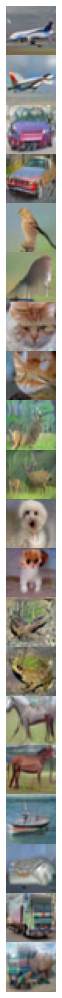

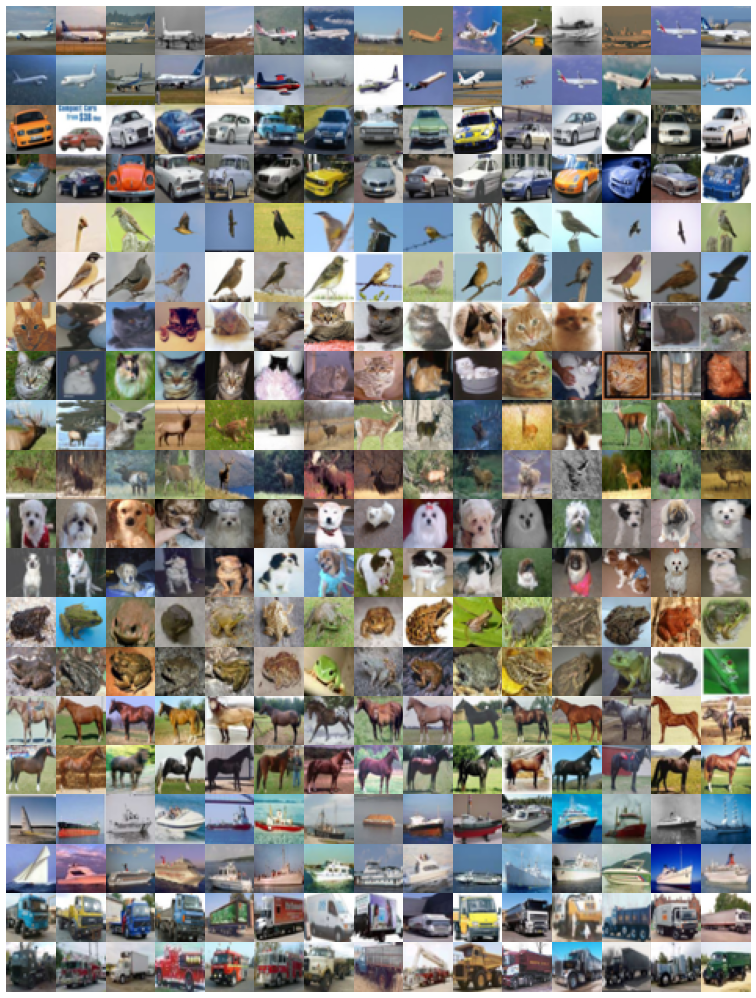

In [ ]:
# with open(f"./data/img_cat_0.pkl", "rb") as f:
#     img_cat = pickle.load(f)
all_imgs = []
for i in range(10):
    with open(f"./data/most_similar_image_{i}_0.pkl", "rb") as f:
        img_sim = pickle.load(f)
        all_imgs.append(img_sim)
    with open(f"./data/most_similar_image_{i}_1.pkl", "rb") as f:
        img_sim = pickle.load(f)
        all_imgs.append(img_sim)
        
#concat all imgs
gen, real = [], []
img_sim = torch.cat(all_imgs, dim=0)
for i, image in enumerate(img_sim):
    if i % 16 == 0:
        gen.append(image)
    else :
        real.append(image)
gen = torch.stack(gen)
real = torch.stack(real)

plot_images(gen,1, name='real')
plot_images(real,15, name = 'gen_ssim')


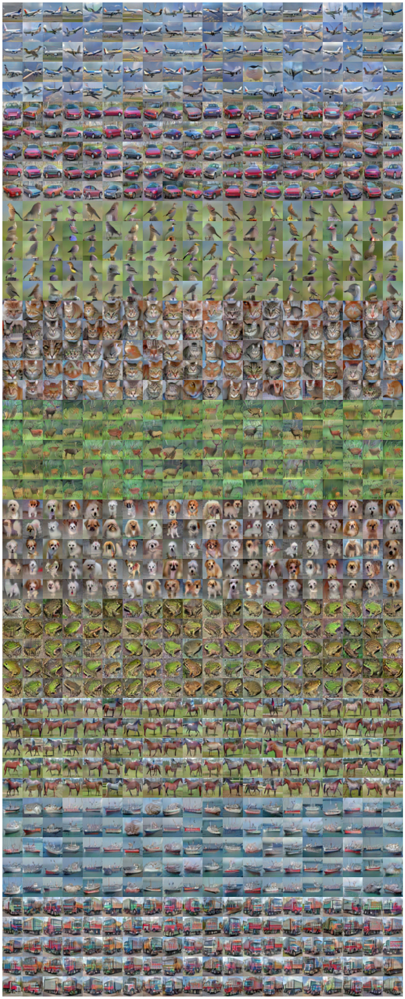

In [ ]:
all_imgs = []

for i in range(10):
    with open(f"./data/img_cat_{i}.pkl", "rb") as f:
        img_cat = pickle.load(f)
        all_imgs.append(img_cat)
img_cat = torch.cat(all_imgs, dim=0)
plot_images(img_cat, 20, name = 'betterdm_img')


## EXPLAINED VARIANCE AND SIGMA PCA VARIABILITY

In [ ]:
NUM_SAMPLES = 5

In [ ]:
ex_var = [0.90, 0.95, 0.99]
sigma_pca = [0.005, 0.01,0.02]

model = models["wang2023"]
model.eval()

img_cat = None
imgs_tot_2 = []
for labels in [[7] ]:
    for v in ex_var:
        for s_pca in sigma_pca:
            print(f"variance: {v}, sigma_pca: {s_pca}")
            fix_seed(seed=seed)
            x0, imgs, energy = utils.new_samples(
                model=model,
                label=labels,
                batch_size=NUM_SAMPLES,
                step_size=0.05,
                n_steps=150,
                inizialization="pca",
                N_STEPS_sampling=1,
                loss="energy_xy",
                replay_buffer=REPLAY_BUFFER,
                buffer=BUFFER,
                sigma_pca = s_pca,
                alpha=1,
                variance=v,
                noise_variance=0.001,
                compute_energy_model=True,
                momentum=0.8,
            )
            imgs_tot_2.append(imgs)


variance: 0.9, sigma_pca: 0.005
Using number of componets 109 with  retained_variance 0.9
variance: 0.9, sigma_pca: 0.01
Using number of componets 109 with  retained_variance 0.9
variance: 0.9, sigma_pca: 0.02
Using number of componets 109 with  retained_variance 0.9
variance: 0.95, sigma_pca: 0.005
Using number of componets 221 with  retained_variance 0.95
variance: 0.95, sigma_pca: 0.01
Using number of componets 221 with  retained_variance 0.95
variance: 0.95, sigma_pca: 0.02
Using number of componets 221 with  retained_variance 0.95
variance: 0.99, sigma_pca: 0.005
Using number of componets 604 with  retained_variance 0.99
variance: 0.99, sigma_pca: 0.01
Using number of componets 604 with  retained_variance 0.99
variance: 0.99, sigma_pca: 0.02
Using number of componets 604 with  retained_variance 0.99


In [ ]:
img_cat_2 = torch.cat(imgs_tot_2, dim=0)

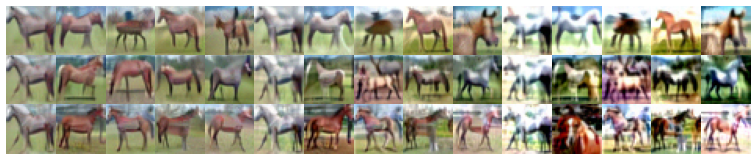

In [ ]:

plot_images(img_cat_2, 15, name = 'sigmavar_2')

In [ ]:
import pickle
with open(f"./data/img_cat_varsigma.pkl", "wb") as f:
    pickle.dump(img_cat, f)


In [ ]:
model = models["wang2023"]
model.eval()

img_cat = None
imgs_tot_2 = []
init_tot = []
for labels in label_to_plot:
    fix_seed(seed=seed)
    x0, imgs, energy = utils.new_samples(
        model=model,
        label=labels,
        batch_size=5,
        step_size=0.05,
        n_steps=150,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        
        momentum=0.8,
    )
    init_tot.append(x0)
    imgs_tot_2.append(imgs)


Using number of componets 514 with  retained_variance 0.99


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacty of 3.81 GiB of which 50.44 MiB is free. Including non-PyTorch memory, this process has 2.95 GiB memory in use. Of the allocated memory 2.84 GiB is allocated by PyTorch, and 33.86 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
init_cat = torch.cat(init_tot, dim=0)


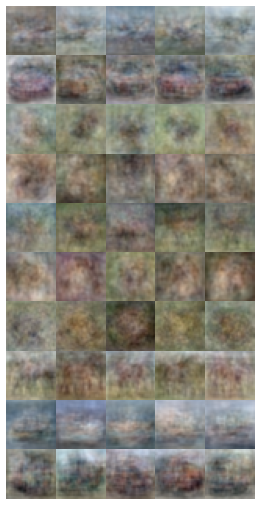

In [ ]:
plot_images(init_cat, 5, name = 'pca_init')

In [ ]:
model = models["wang2023"]
model.eval()

img_cat = None
imgs_tot_pca = []
init_tot_inf = []
NUM_SAMPLES= 10
for labels in label_to_plot:
    fix_seed(seed=seed)
    x0, imgs, energy = utils.new_samples(
        model=model,
        label=labels,
        batch_size=NUM_SAMPLES,
        step_size=0.05,
        n_steps=150,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        compute_energy_model=True,
        momentum=0.8,
    )
    init_tot_inf.append(x0)
    imgs_tot_pca.append(imgs)


KeyboardInterrupt: 

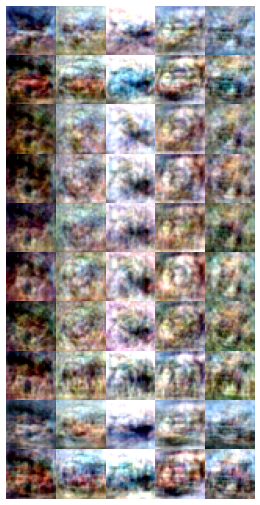

In [ ]:
init_cat_inf = torch.cat(init_tot_inf, dim=0)
plot_images(init_cat_inf, 5, name = 'informative_init')

In [ ]:
#concat two tensors
init_cat = torch.cat([init_cat, init_cat_inf], dim=0)

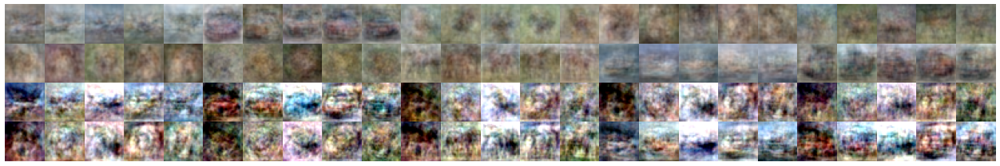

In [ ]:
plot_images(init_cat, init_cat_inf.shape[0]//2, name = 'pca_informative_init')

In [ ]:
print(init_cat.shape)

torch.Size([100, 3, 32, 32])


In [ ]:
# split the tensor in two
init_cat_1 = init_cat[:init_cat.shape[0]//2]
init_cat_2 = init_cat[init_cat.shape[0]//2:]


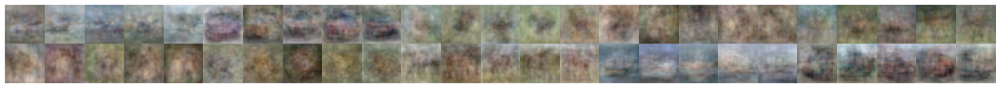

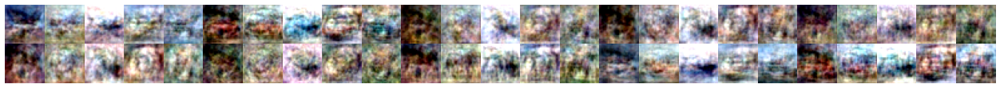

In [ ]:
plot_images(init_cat_1, init_cat_1.shape[0]//2, name = 'pca_init')
plot_images(init_cat_2, init_cat_2.shape[0]//2, name = 'informative_init')

Using number of componets 514 with  retained_variance 0.99


/home/mary/miniconda3/envs/robustbench/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392020201/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 525 with  retained_variance 0.99
Using number of componets 630 with  retained_variance 0.99
Using number of componets 538 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 604 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99
Using number of componets 659 with  retained_variance 0.99


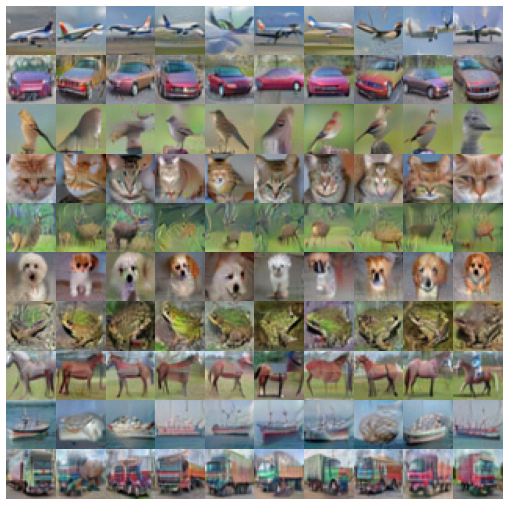

In [ ]:
model = models["wang2023"]
model.eval()

img_cat = None
imgs_tot_pca = []
init_tot_inf = []
NUM_SAMPLES= 10
for labels in label_to_plot:
    fix_seed(seed=seed)
    x0, imgs, energy = utils.new_samples(
        model=model,
        label=labels,
        batch_size=NUM_SAMPLES,
        step_size=0.05,
        n_steps=150,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        compute_energy_model=True,
        momentum=0.8,
    )
    init_tot_inf.append(x0)
    imgs_tot_pca.append(imgs)
img_betterdm = torch.cat(imgs_tot_pca, dim=0)
plot_images(img_betterdm, NUM_SAMPLES, name = 'betterdm_img')

Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 525 with  retained_variance 0.99
Using number of componets 630 with  retained_variance 0.99
Using number of componets 538 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 604 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99
Using number of componets 659 with  retained_variance 0.99


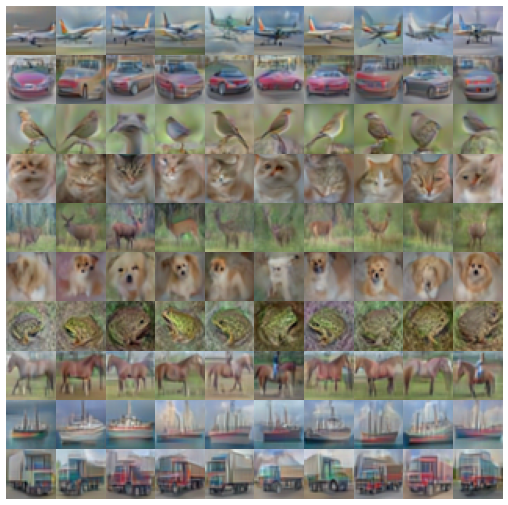

In [ ]:
model = models["SAT"]
model.eval()

img_cat = None
imgs_tot_pca = []
init_tot_inf = []
NUM_SAMPLES= 10
for labels in label_to_plot:
    fix_seed(seed=seed)
    x0, imgs, energy = utils.new_samples(
        model=model,
        label=labels,
        batch_size=NUM_SAMPLES,
        step_size=0.05,
        n_steps=20,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        compute_energy_model=True,
        momentum=0.5,
    )
    init_tot_inf.append(x0)
    imgs_tot_pca.append(imgs)
img_sat = torch.cat(imgs_tot_pca, dim=0)
plot_images(img_sat, NUM_SAMPLES, name = 'sat_imgs_')

Using number of componets 514 with  retained_variance 0.99
Using number of componets 644 with  retained_variance 0.99
Using number of componets 574 with  retained_variance 0.99
Using number of componets 525 with  retained_variance 0.99
Using number of componets 630 with  retained_variance 0.99
Using number of componets 538 with  retained_variance 0.99
Using number of componets 709 with  retained_variance 0.99
Using number of componets 604 with  retained_variance 0.99
Using number of componets 510 with  retained_variance 0.99
Using number of componets 659 with  retained_variance 0.99


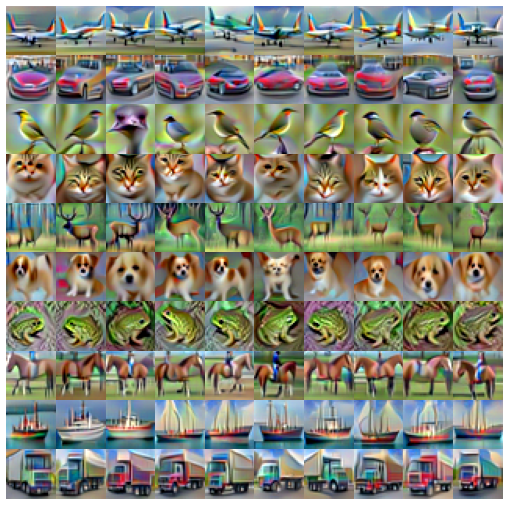

In [ ]:
model = models["SAT"]
model.eval()

img_cat = None
imgs_tot_pca = []
init_tot_inf = []
NUM_SAMPLES= 10
for labels in label_to_plot:
    fix_seed(seed=seed)
    x0, imgs, energy = utils.new_samples(
        model=model,
        label=labels,
        batch_size=NUM_SAMPLES,
        step_size=0.05,
        n_steps=50,
        inizialization="pca",
        N_STEPS_sampling=1,
        loss="energy_xy",
        replay_buffer=REPLAY_BUFFER,
        buffer=BUFFER,
        sigma_pca = 0.005,
        alpha=1,
        variance=0.99,
        noise_variance=0.001,
        compute_energy_model=True,
        momentum=0.8,
    )
    init_tot_inf.append(x0)
    imgs_tot_pca.append(imgs)
img_sat = torch.cat(imgs_tot_pca, dim=0)
plot_images(img_sat, NUM_SAMPLES, name = 'sat_imgs')